<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
Satellite Image Data <br><br><br>Analysis using numpy</p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>Data Source: Satellite Image from WIFIRE Project</p>


WIFIRE is an integrated system for wildfire analysis, with specific regard to changing urban dynamics and climate. The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, with computational techniques in signal processing, visualization, modeling, and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread. You can read more about WIFIRE at: https://wifire.ucsd.edu/

In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.


### Loading the libraries we need: numpy, scipy, matplotlib

In [1]:
%matplotlib inline
import numpy as np
import scipy as misc
import matplotlib.pyplot as plt
import imageio

In [2]:
import sys; print(sys.executable)

/home/kiran/anaconda3/envs/DataScience/bin/python


# Creating a numpy array from an image file:

**Lets choose a WIFIRE satellite image file as an ndarray and display its type.**

In [3]:
from skimage import data

photo_data = imageio.imread("./sd-3layers.jpg")

type(photo_data)

imageio.core.util.Array

Let's see what is in this image. 

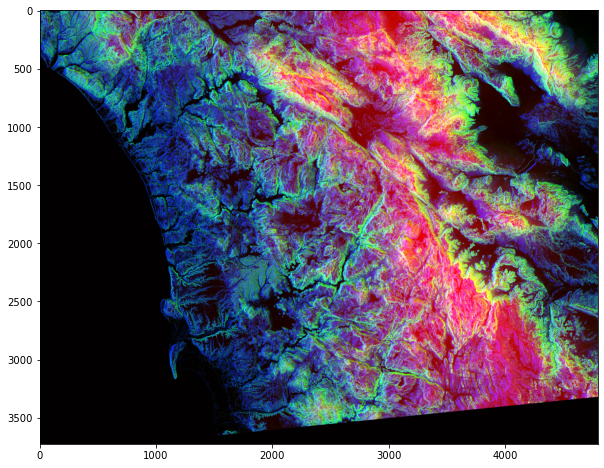

In [4]:
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

In [5]:
photo_data.shape

#print(photo_data)

(3725, 4797, 3)

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
RGB Color Mapping in the Photo:</p> <br>
<ul>
<li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold">
RED pixel indicates Altitude</p>
<li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold">
BLUE pixel indicates Aspect
</p>
<li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.

In [6]:
photo_data.size

53606475

In [7]:
photo_data.min(), photo_data.max()

(0, 255)

In [8]:
photo_data.mean()

75.8299354508947

**RGB value = Pixel on the 150th Row and 250th Column**

In [9]:
photo_data[150, 250]

#R = 17, G = 35, B = 255

Array([ 17,  35, 255], dtype=uint8)

In [10]:
photo_data[150, 250, 0], photo_data[150, 250, 1], photo_data[150, 250, 2]

(17, 35, 255)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Set a Pixel to All Zeros</p>
<br/>
We can set all three layer in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.

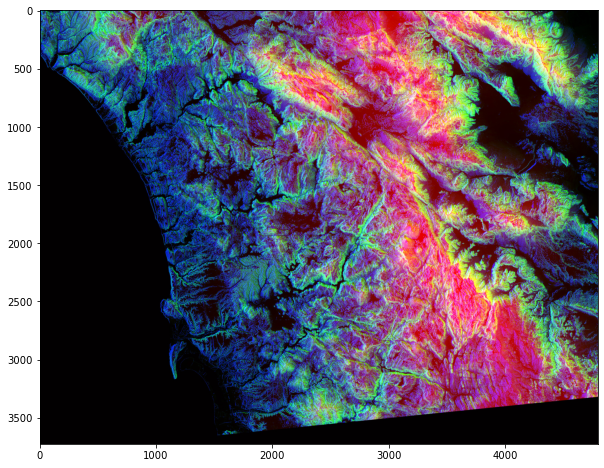

In [11]:
photo_data[150, 250] = 0
plt.figure(figsize = [10, 10])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Changing Colors in a Range<p/>
<br/>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity.

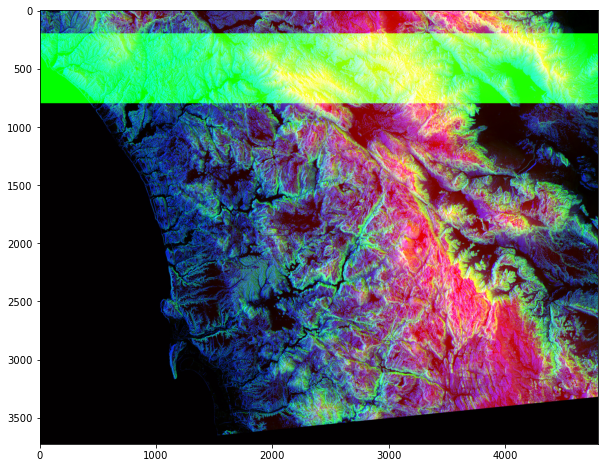

In [12]:
photo_data = imageio.imread("./sd-3layers.jpg")

photo_data[200:800, :, 1] = 255

plt.figure(figsize=[10, 10])
plt.imshow(photo_data)

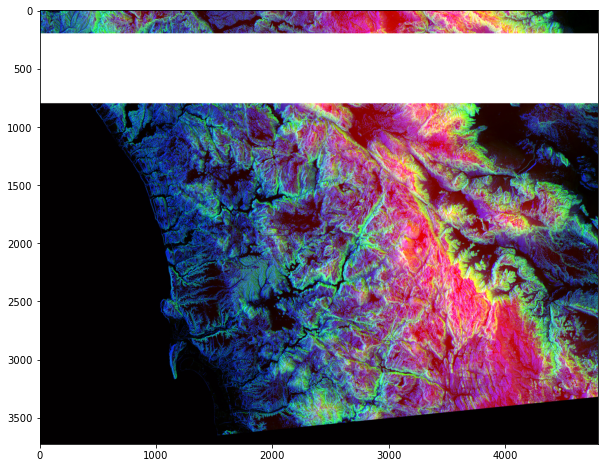

In [13]:
photo_data = imageio.imread("./sd-3layers.jpg")

photo_data[200:800, :] = 255

plt.figure(figsize=[10, 10])
plt.imshow(photo_data)

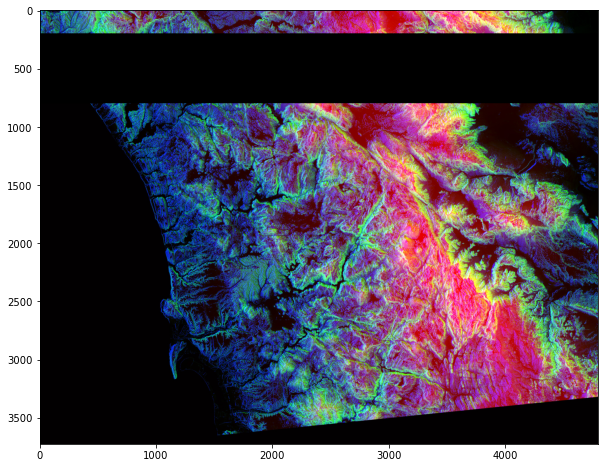

In [14]:
photo_data = imageio.imread("./sd-3layers.jpg")

photo_data[200:800, :] = 0

plt.figure(figsize=[10, 10])
plt.imshow(photo_data)

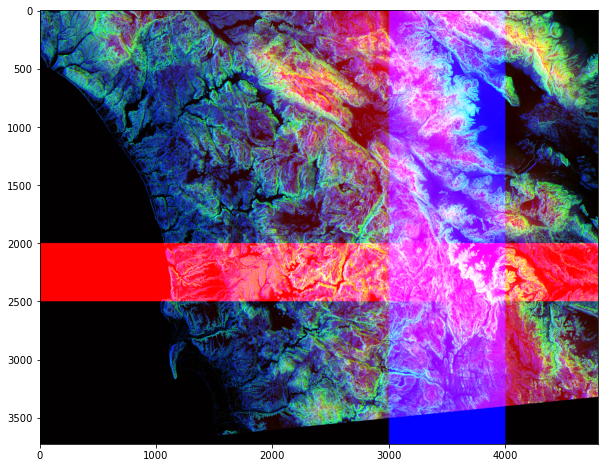

In [15]:
photo_data = imageio.imread('./sd-3layers.jpg')

photo_data[2000:2500, :, 0] = 255
photo_data[:, 3000:4000, 2] = 255

plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pick all Pixels with Low Values</p>

**low_value_filter =  bullion ndarray** 

In [16]:
photo_data = imageio.imread('./sd-3layers.jpg')

print("Shape of photo_data :", photo_data.shape)

low_value_filter = photo_data < 200

print("Shape of low_value_filter :", low_value_filter.shape)

Shape of photo_data : (3725, 4797, 3)
Shape of low_value_filter : (3725, 4797, 3)


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Filtering Out Low Values</p><br/>
Whenever the low_value_filter is True, set value to 0.

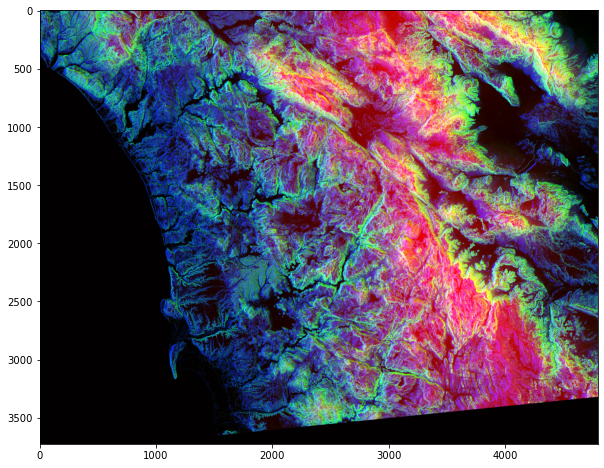

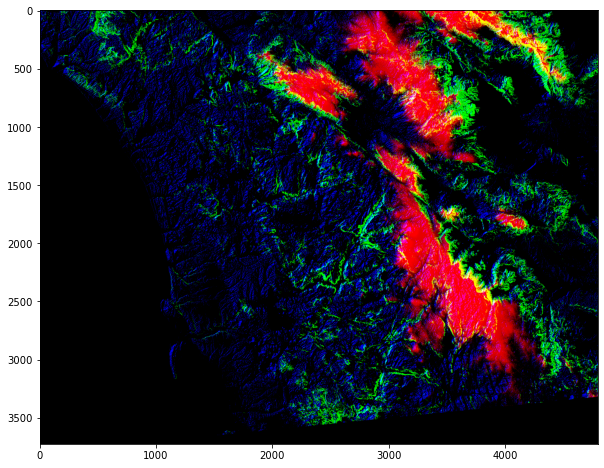

In [17]:
plt.figure(figsize=[10, 10])
plt.imshow(photo_data)

photo_data[low_value_filter] = 0

plt.figure(figsize=[10, 10])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
More Row and Column Operations</p><br>
You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [18]:
# photo_data = imageio.imread('./sd-3layers.jpg')

row = np.arange(len(photo_data))

col = row

print(type(row))

<class 'numpy.ndarray'>


In [19]:
photo_data[row, col] = 255

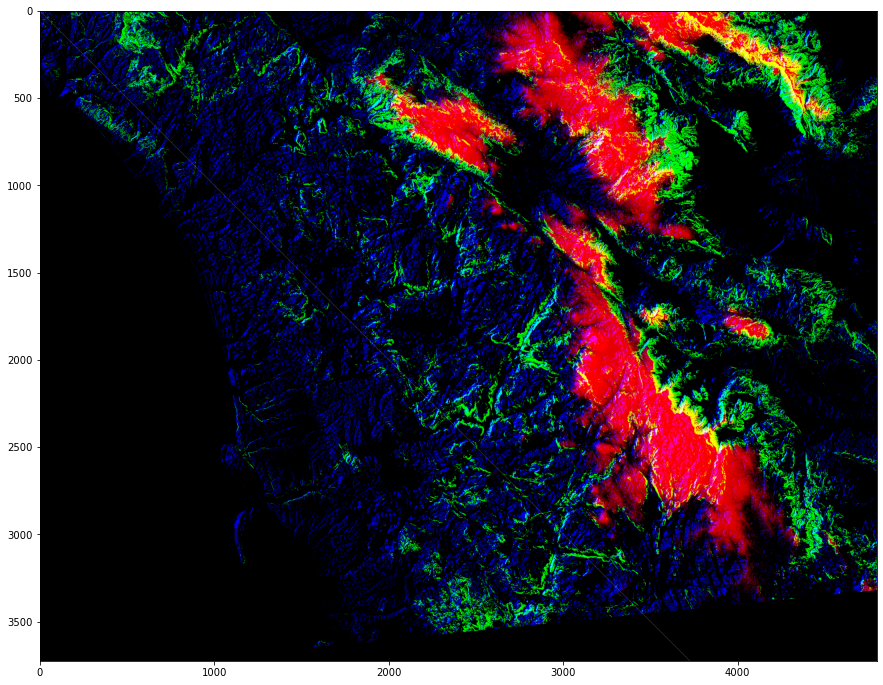

In [20]:
plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Now let us try something even cooler...a mask that is in shape of a circular disc.

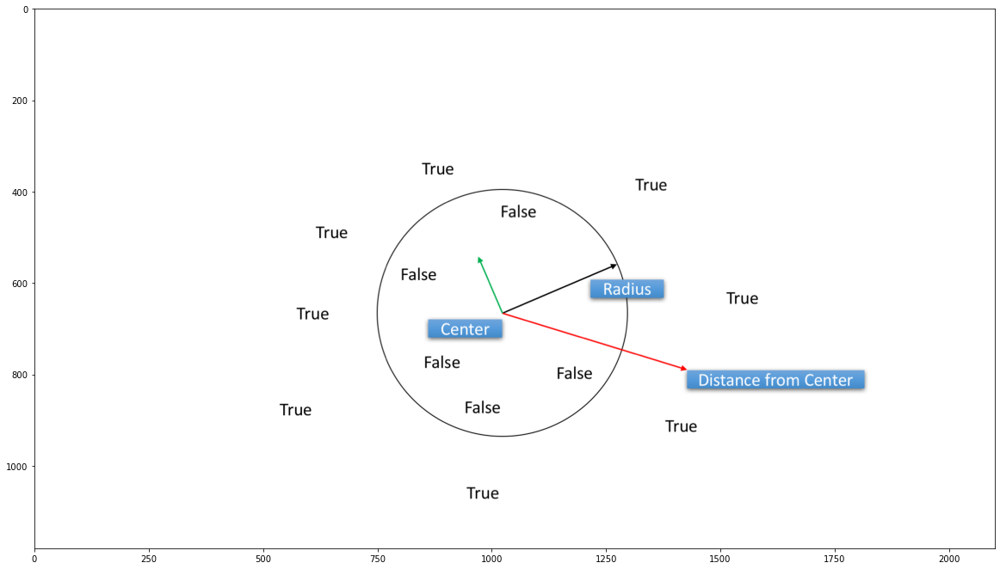

In [21]:
img = imageio.imread('./1494532821.png')

plt.figure(figsize=[20, 20])

plt.imshow(img)

In [22]:
photo_data = imageio.imread('./sd-3layers.jpg')

total_row, total_col, total_layer = photo_data.shape

print("photo data =", photo_data.shape)

x, y = np.ogrid[:total_row, :total_col]

print("x =", x.shape, "y =", y.shape)

# x and y are vectors that match the number of rows and columns

photo data = (3725, 4797, 3)
x = (3725, 1) y = (1, 4797)


In [23]:
center_row, center_col = total_row / 2, total_col / 2

print("center_row =", center_row, "center_col = ", center_col)
#print(x-center_row)
#print(y-center_col)

dist_from_center = (x-center_row)** 2 + (y-center_col)**2

#print("dist_from_center =", dist_from_center)

radius = (total_row / 2)**2

#print("radius =",radius)

circular_mask = dist_from_center > radius

#print(circular_mask)
#print(circular_mask[1500:1700, 2000:2200])

center_row = 1862.5 center_col =  2398.5


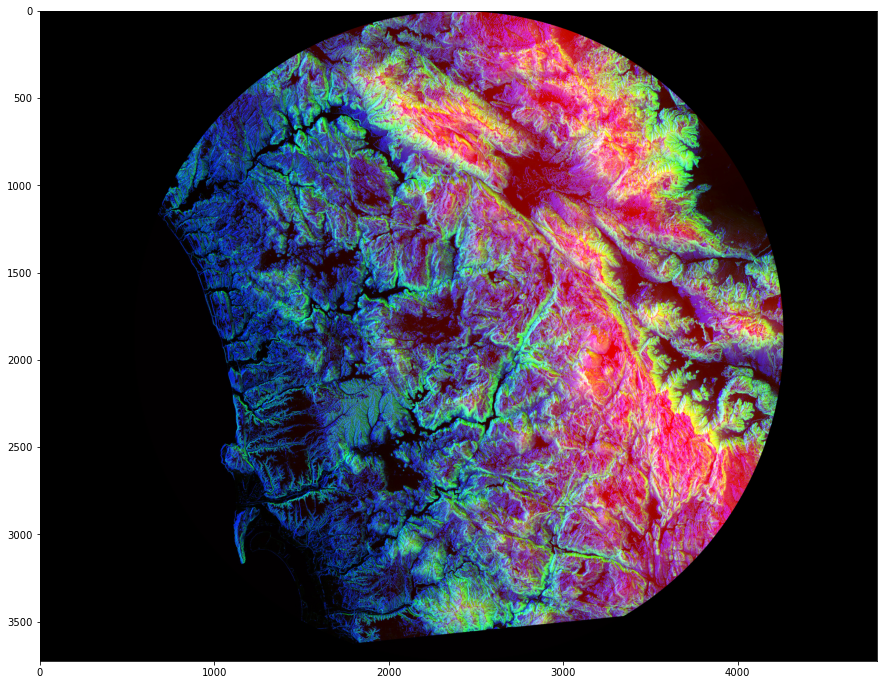

In [24]:
photo_data[circular_mask] = 0

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

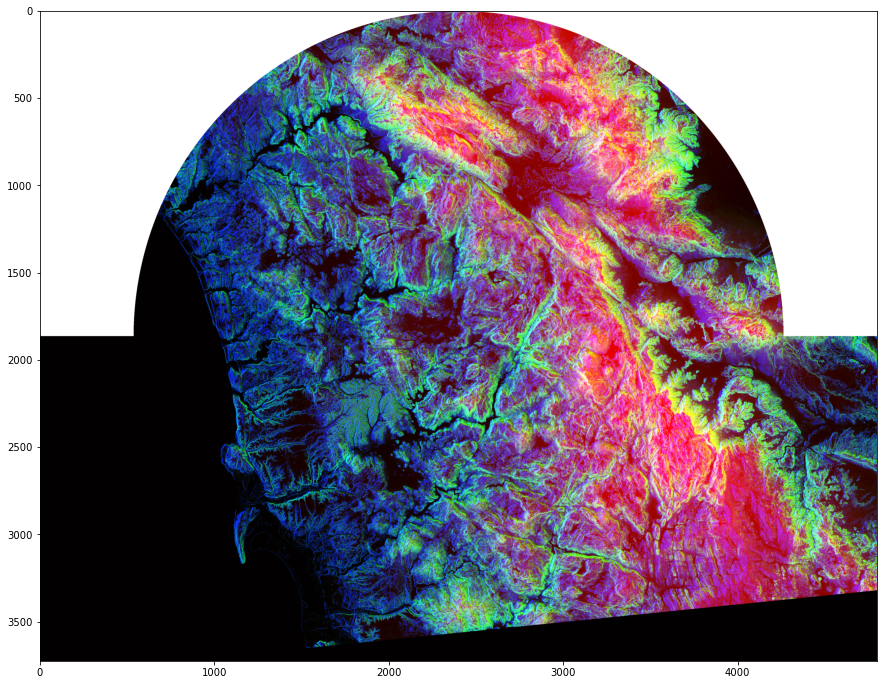

In [25]:
photo_data = imageio.imread('./sd-3layers.jpg')

x, y = np.ogrid[:total_row, :total_col]

half_uppar = x < center_row

half_uppar_mast = np.logical_and(half_uppar, circular_mask)

photo_data[half_uppar_mast] = 255

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

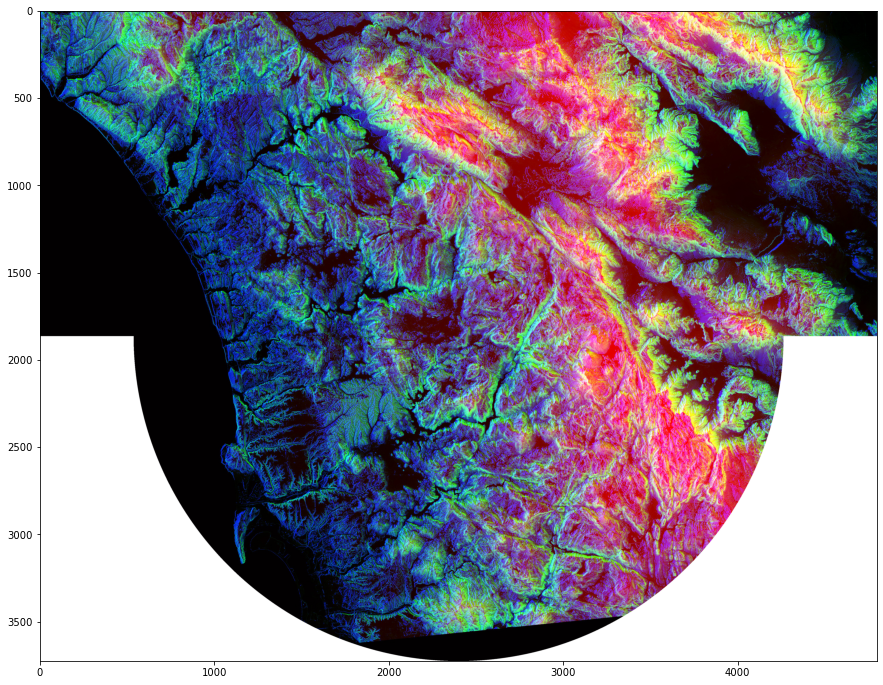

In [26]:
photo_data = imageio.imread('./sd-3layers.jpg')

x, y = np.ogrid[:total_row,:total_col]

lower_half = x > center_row

lower_half_mask = np.logical_and(lower_half, circular_mask)

photo_data[lower_half_mask] = 255

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>
Further Processing of our Satellite Imagery </p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Processing of RED Pixels</p>

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

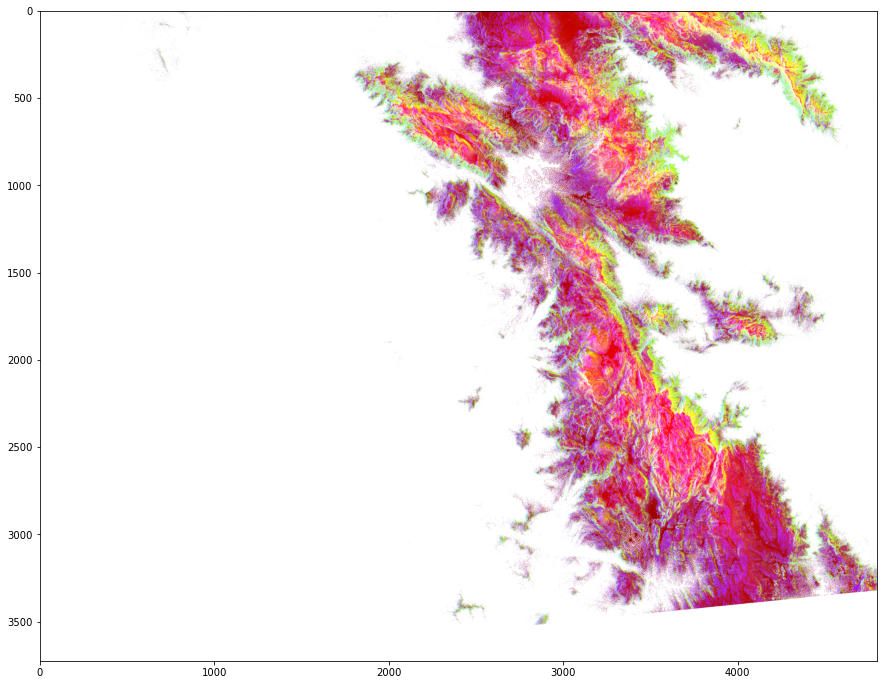

In [27]:
photo_data = imageio.imread('./sd-3layers.jpg')

red_mask = photo_data[:, :, 0] < 150

photo_data[red_mask] = 255

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-GREEN Pixels</p>

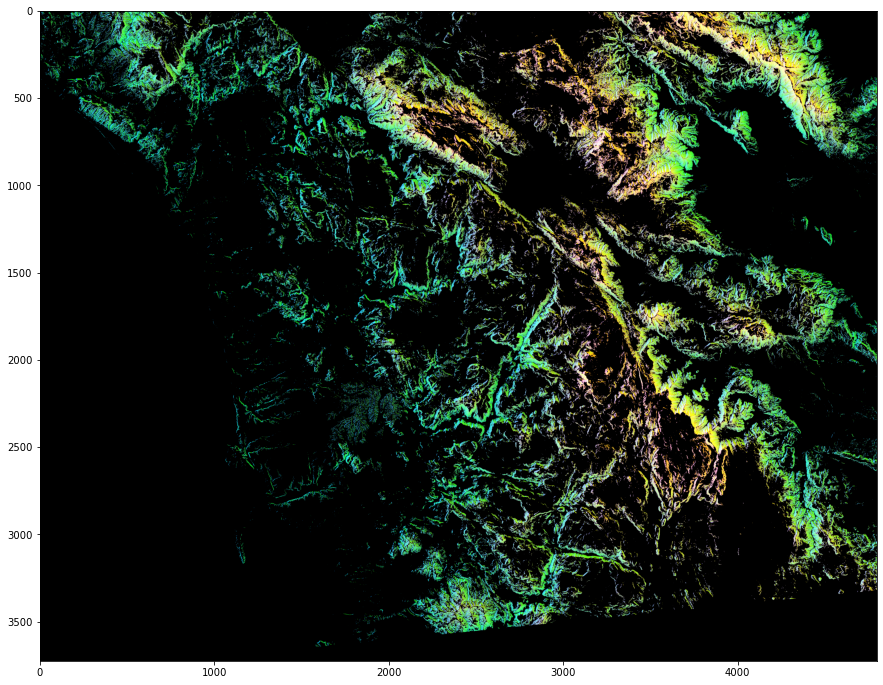

In [28]:
photo_data = imageio.imread('./sd-3layers.jpg')

green_mask = photo_data[:, :, 1] < 150

photo_data[green_mask] = 0

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-BLUE Pixels</p>

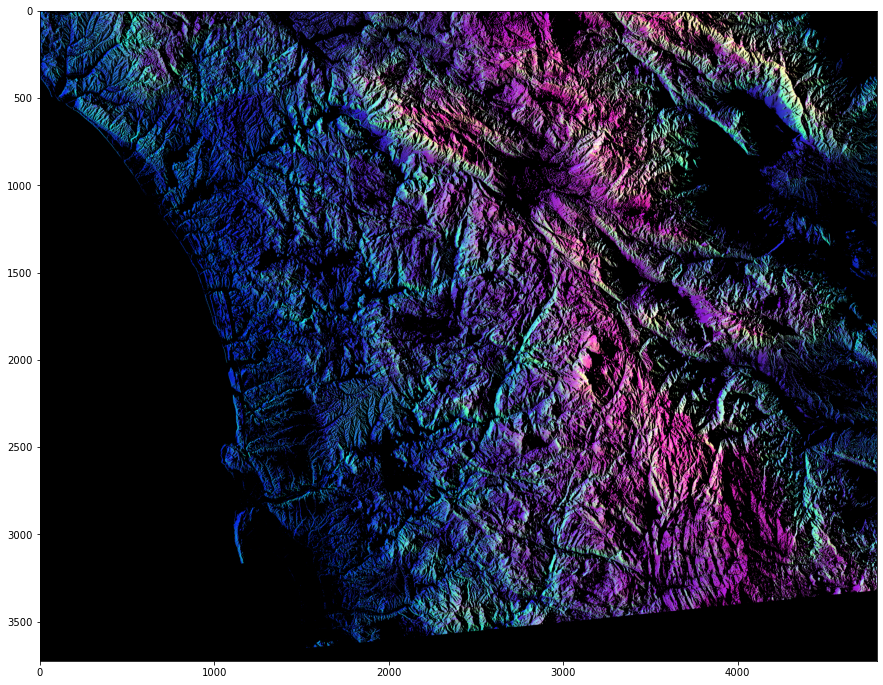

In [29]:
photo_data = imageio.imread('./sd-3layers.jpg')

blue_mask = photo_data[:, :, 2] < 150

photo_data[blue_mask] = 0

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

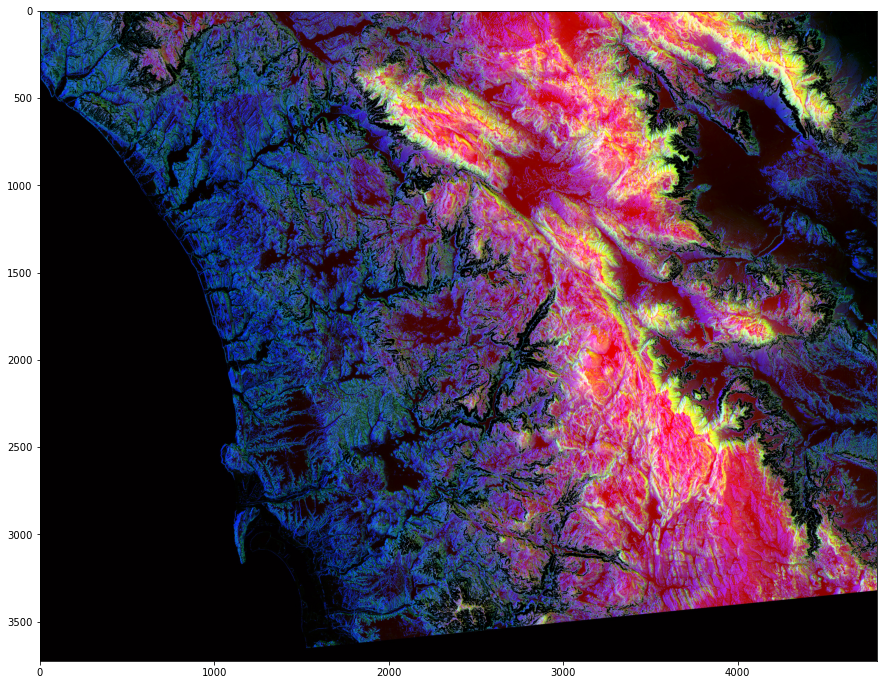

In [30]:
photo_data = imageio.imread('./sd-3layers.jpg')

red_mask = photo_data[:, :, 0] < 150

green_mask = photo_data[:, :, 1] > 150

blue_mask = photo_data[:, :, 2] < 150

final_mask = np.logical_and(red_mask, green_mask, blue_mask)

photo_data[final_mask] = 0

plt.figure(figsize=[15, 15])
plt.imshow(photo_data)